### Importation

In [1]:
import numpy as np
import torch 
from framework.SMS import import_dataset_fromSMS
import networkx as nx

distance_mode = "dijkstra" # "linear_interpolation" or "dijkstra"

datasetName = "swiss1"
datasetSuffix = "-500"
datasetPath = "data/SMS/" + datasetName  + datasetSuffix + "/"
datasetSMS = import_dataset_fromSMS(datasetPath)

CORRUPTED_NODES = 70

sim = list(datasetSMS.keys())[0]
mat = datasetSMS[sim]['adjacency_matrix']
num_nodes = mat.shape[0]
p_vectors_array = datasetSMS[sim]['p_array']
dimP = p_vectors_array.shape[1]

torch_points_labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES)


#plot_graph_from_adjacency_matrix(mat, node_color_scalars=np.sum(p_vectors_array, axis=1), cmap='plasma')

def read_matrix_from_csv_loadtxt(filepath, delimiter=','):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None


path = "data/SMS/" + datasetName  + datasetSuffix +"/sim_" + str(sim)+ "/" + datasetName
p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_p_matrix.csv"))
true_p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_true_p_matrix.csv"))
dimP = p_vectors_array.shape[1]
for x in datasetSMS.values():
    x["p_array"]=p_vectors_array


Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_p_matrix.csv using np.loadtxt().
Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_true_p_matrix.csv using np.loadtxt().


In [2]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *
from scipy.sparse.csgraph import shortest_path


latent_dim = 2
input_dim = dimP
batch_size = 16

encoder_hidden_dims=[128, 64, 32]
adj_decoder_hidden_dims=[64, 64, 32]
node_decoder_hidden_dims=[64, 64, 32]
gcn_layers=3
fc_layers=2

dataset = []
for x in datasetSMS.values():
    # Create PyG data object
    x["distance_matrix"] = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")
    data = Data(x=torch.tensor(x["p_array"], dtype=torch.float), 
                edge_index=adj_matrix_to_edge_index(x["adjacency_matrix"])[0], 
                edge_labels=adj_matrix_to_edge_index(x["adjacency_matrix"])[1],
                adjacency_matrix=torch.tensor(x["adjacency_matrix"]))
    dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]

adjacency_matrix = x["adjacency_matrix"]
dist_mat = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")

G = nx.from_numpy_array(dist_mat)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

### Theoretical manifold

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 2601 grid points...


Grid compute: 100%|██████████| 2601/2601 [00:00<00:00, 2851.90it/s]


Completed. Cached 2601 / 2601 points.


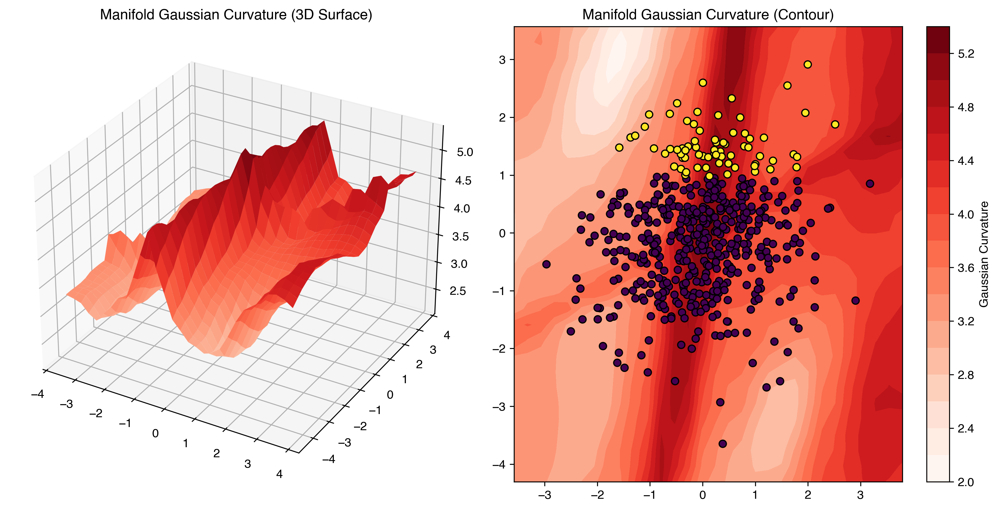

In [3]:
from framework.synthetic_manifold import get_metric
from framework.boundedManifold import BoundedManifold

true_metric = get_metric("soft_swiss", seed=42)

def get_theoretical_metric_tensor(point: torch.tensor):
    return torch.tensor(true_metric(point[0], point[1], dimP))
TheoreticalManifold = BoundedManifold(get_theoretical_metric_tensor, bounds=BoundedManifold.hypercube_bounds(torch.tensor(true_p_vectors_array), margin=0.1, relative=True))
TheoreticalManifold.visualize_manifold_curvature(data_points=torch.tensor(true_p_vectors_array), labels=torch_points_labels)

In [4]:
from framework.torchVersions.distanceApproximations import DistanceApproximations

true_p_vectors_tensor = torch.tensor(true_p_vectors_array)
theoretical_distances = TheoreticalManifold.create_riemannian_distance_matrix(true_p_vectors_tensor,
                                                                            DistanceApproximations.linear_interpolation_distance, 
                                                                            batch_size=8, num_points=20)
theoretical_distances_dijkstra = TheoreticalManifold.get_grid_as_graph().compute_shortest_paths(
    true_p_vectors_tensor,
    weight_type="geodesic",  # Uses your metric tensors
    max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
    num_threads=6
)

Calculating 124750 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 15594/15594 [00:02<00:00, 6223.79it/s]


Distance matrix calculation complete.


Building adjacency (original edges):   0%|          | 0/10100 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/1686 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

### Phase 1

#### Training

In [5]:
phase1_epochs = 1500
phase2_epochs = 200
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"

encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[16, 16],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ELU()
)


node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[16],
    dropout=0,
    activation=nn.ELU(),
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=2,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


In [6]:
import os

if os.path.exists("model_phase1_swissSMS.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_swissSMS.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_swissSMS.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/449094116.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('model

In [7]:
import copy

model_phase1 = model_phase1.to('cpu')
model_phase1.encoder.eval()
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]


Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6843.48it/s]


Completed. Cached 10201 / 10201 points.


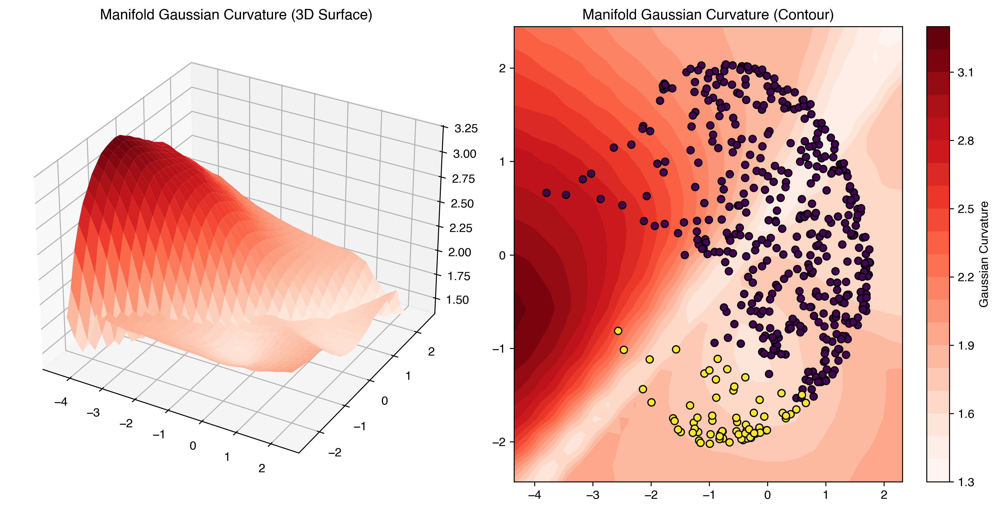

In [8]:

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))


In [9]:

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase1 = model_phase1.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

#### Benchmarking

In [10]:
from framework.synthetic_manifold import ManifoldConfig, generate_manifold_data, approx_jacobian_rank, IMMERSIONS, load_dataset, metric_pullback_alignment_error, geodesic_benchmark

X, Z_true, meta, Z_vae, immersion, true_metric = load_dataset(datasetPath + "soft_swiss")

def VAE_metric_phase1(point : np.ndarray):
    return model_phase1.get_latent_manifold().metric_tensor(torch.tensor(point)).detach().numpy()

summary = metric_pullback_alignment_error(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    D=20,
    k=12,
)

geo = geodesic_benchmark(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    D=20,
    k_graph=12,
    subsample=500,  # speed
)
print("Geodesic distance correlation:", geo["pairwise_corr"])
print("Mean pullback metric rel. error:", summary["mean_rel_error"])
print("Volume element corr (sqrt(det G)):", summary["volume_corr"])


Geodesic distance correlation: 0.40714370353367596
Mean pullback metric rel. error: 0.9999999999553315
Volume element corr (sqrt(det G)): 0.28228981997372565


In [11]:
def tangent_angle_benchmark(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_metric_func: Callable[[float,float,int], np.ndarray],
    vae_metric_func: Callable[[np.ndarray], np.ndarray],
    D: int,
    subsample: int | None = 300
) -> dict:
    """
    Compare angles between random tangent vectors at corresponding points.
    Returns correlation of cos(theta) between true and VAE tangent vectors.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    cos_angles_true = []
    cos_angles_vae  = []

    for i in range(len(U)):
        # Random tangent vectors in latent space
        rng = np.random.default_rng(i)
        v1 = rng.normal(size=(2,))
        v2 = rng.normal(size=(2,))
        v1 /= np.linalg.norm(v1)
        v2 /= np.linalg.norm(v2)

        Gtrue = true_metric_func(float(U[i,0]), float(U[i,1]), D)
        Gvae  = vae_metric_func(Z[i])

        # Compute squared lengths & angles via pullback metric
        def cos_angle(v1,v2,G):
            return (v1 @ G @ v2) / (np.sqrt(v1 @ G @ v1) * np.sqrt(v2 @ G @ v2))

        cos_angles_true.append(cos_angle(v1,v2,Gtrue))
        cos_angles_vae.append(cos_angle(v1,v2,Gvae))

    corr = np.corrcoef(cos_angles_true, cos_angles_vae)[0,1]

    return {
        "tangent_angle_corr": float(corr),
        "cos_true": np.array(cos_angles_true),
        "cos_vae": np.array(cos_angles_vae),
        "indices": idx,
    }


def curvature_benchmark(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_curvature_func: Callable[[float,float,int], float],
    vae_curvature_func: Callable[[np.ndarray], float],
    subsample: int | None = 300
) -> dict:
    """
    Compare scalar curvatures (Gaussian or Ricci for 2D manifold) at corresponding points.
    Returns correlation of scalar curvature.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    K_true = np.array([true_curvature_func(U[i]) for i in range(len(U))])
    K_vae  = np.array([vae_curvature_func(Z[i]) for i in range(len(Z))])

    corr = np.corrcoef(K_true, K_vae)[0,1]

    return {
        "curvature_corr": float(corr),
        "K_true": K_true,
        "K_vae": K_vae,
        "indices": idx,
    }


def rank_distance_correlation(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_metric_func: Callable[[float,float,int], np.ndarray],
    vae_metric_func: Callable[[np.ndarray], np.ndarray],
    D: int,
    subsample: int | None = 300
) -> dict:
    """
    Compute pairwise distance matrices (Euclidean w.r.t. pullback metric) and rank correlation.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    # Compute pairwise distances
    def pairwise_dists(X, metric_func):
        M = len(X)
        Dmat = np.zeros((M,M))
        for i in range(M):
            G_i = metric_func(X[i])
            for j in range(i+1, M):
                diff = X[j] - X[i]
                Dmat[i,j] = Dmat[j,i] = np.sqrt(diff @ G_i @ diff)
        return Dmat

    D_true = pairwise_dists(U, lambda pt: true_metric_func(float(pt[0]), float(pt[1]), D))
    D_vae  = pairwise_dists(Z, vae_metric_func)

    iu, ju = np.triu_indices(D_true.shape[0], k=1)
    ranks_true = np.argsort(np.argsort(D_true[iu,ju]))
    ranks_vae  = np.argsort(np.argsort(D_vae[iu,ju]))
    corr = np.corrcoef(ranks_true, ranks_vae)[0,1]

    return {
        "rank_corr": float(corr),
        "D_true": D_true,
        "D_vae": D_vae,
        "indices": idx,
    }

In [12]:
angles = tangent_angle_benchmark(seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    subsample=500,  # speed
    D=20,
)

print("Angles between tangent vectors correlation:", angles["tangent_angle_corr"])

ranks = rank_distance_correlation(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    subsample=500,  # speed
    D=20,
) 
print("Pairwise distance rank correlation:", ranks["rank_corr"])


Angles between tangent vectors correlation: 0.8432219648257131
Pairwise distance rank correlation: 0.430132900430917


In [13]:
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report
x = (theoretical_distances/torch.max(theoretical_distances)).flatten().numpy().reshape(-1, 1)
dists_phase1 = torch.tensor(dists_phase1)
y1 = (dists_phase1/torch.max(dists_phase1)).flatten().numpy()
# 2. Add an intercept column for the statsmodels OLS model
#x = sm.add_constant(x)

# 3. Create and fit the OLS (Ordinary Least Squares) model
model = sm.OLS(x,y1)
results = model.fit()

# 4. Print the R-style summary
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.894
Model:                            OLS   Adj. R-squared (uncentered):              0.894
Method:                 Least Squares   F-statistic:                          2.101e+06
Date:                Thu, 15 Jan 2026   Prob (F-statistic):                        0.00
Time:                        19:29:08   Log-Likelihood:                      3.2173e+05
No. Observations:              250000   AIC:                                 -6.434e+05
Df Residuals:                  249999   BIC:                                 -6.434e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/2775034190.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dists_phase1 = torch.tensor(dists_phase1)


In [14]:
from scipy.stats import spearmanr

spearman_rho, p_value = spearmanr(x, y1)

print(f"The Spearman correlation coefficient is: {spearman_rho:.4f}")
print(f"The p-value is: {p_value:.4f}")


The Spearman correlation coefficient is: 0.8454
The p-value is: 0.0000


## Phase 2

In [15]:
from framework.KLAnnealingScheduler import NoKLScheduler

#lr_phase2 = 0.0005
lr_phase2 = 0.008
phase2_epochs = 100
num_heat_times = 15

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)


distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    ema_lag_factor=0.005,
    num_heat_time=num_heat_times,
    retain_high_freq_threshold=0.7,
    suppress_low_freq_threshold= 5e-1,
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()


if os.path.exists("model_phase2_swissSMS_"+ distance_mode + ".pth"):
    print("Loading pretrained model")
    model_phase2.load_state_dict(torch.load('model_phase2_swissSMS_'+ distance_mode + '.pth'))
else:
    # Phase 2 training
    history_phase2 = train_phase2(
        model=model_phase2,
        data_loader=single_graph_list,
        latent_points=latent_points,
        num_epochs=phase2_epochs,
        lr=lr_phase2,
        weight_decay=1e-5,
    #    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
        decoder_weights={"adj_decoder": 1, "node_attr_decoder":0 },
        verbose=True,
        device=device
    )

    print("\n=== Phase 2 Complete ===")


=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===
Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/3674410192.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase2.load_state_dict(torch.load('mod

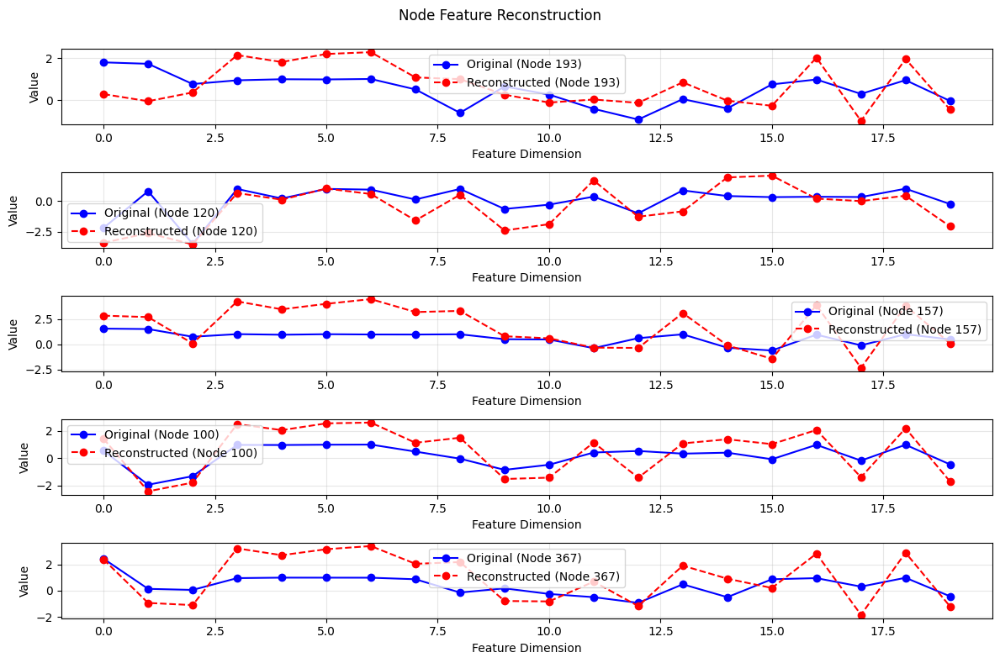

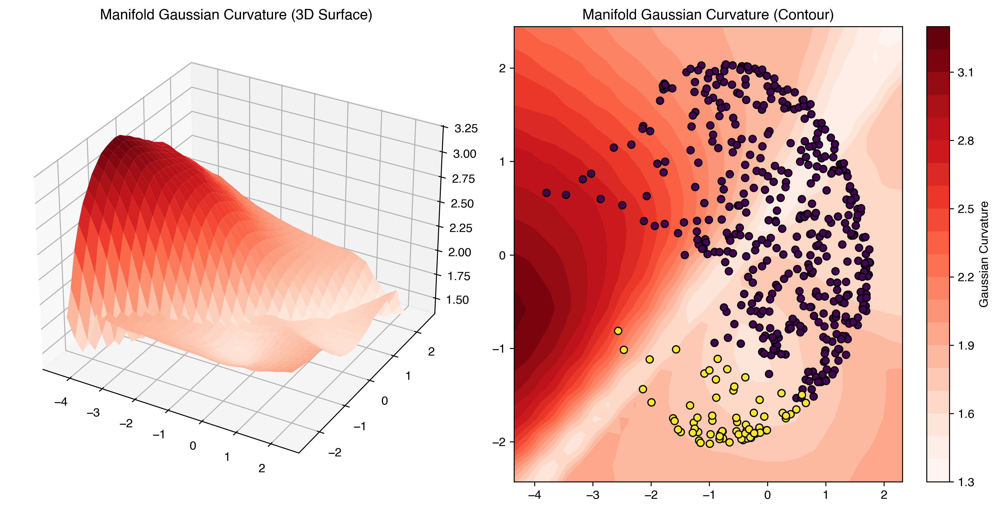

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7290.22it/s]


Completed. Cached 10201 / 10201 points.


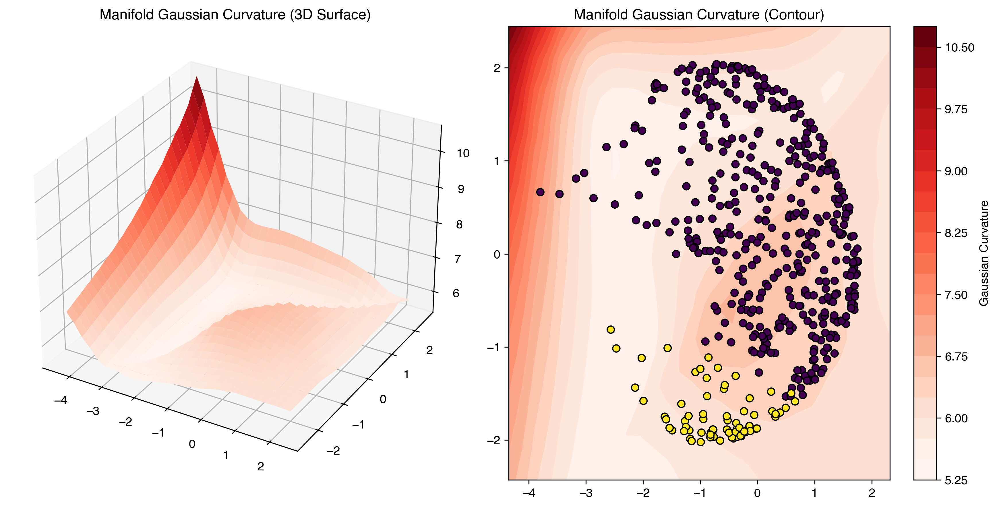

In [16]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)
model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)

Full grid already computed for current epoch.
Full grid already computed for current epoch.


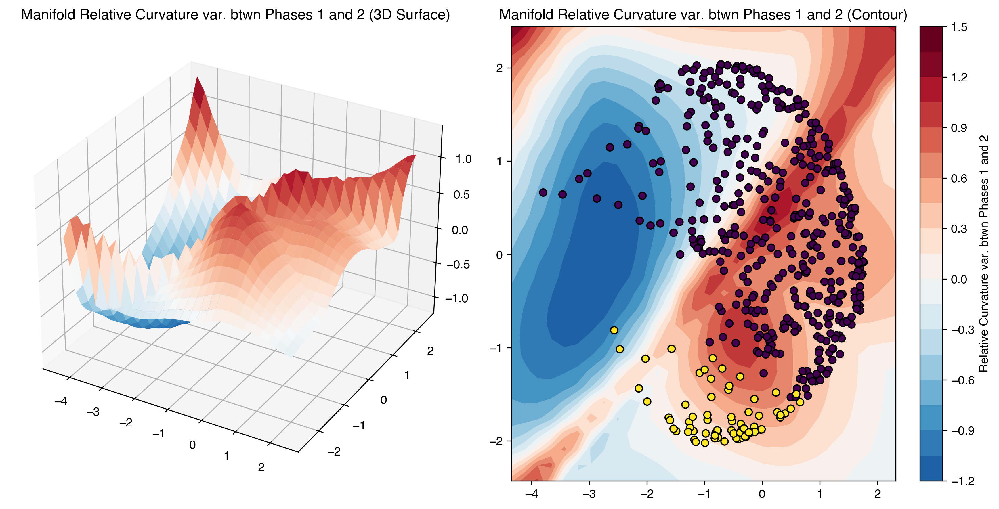

In [ ]:
from framework.utils import compute_curvature_change
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points, labels=torch_points_labels, name="Relative Curvature var. btwn Phases 1 and 2")

In [18]:
from framework.torchVersions.distanceApproximations import DistanceApproximations

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

## Clustering

#### Baseline

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.csgraph import laplacian
from scipy.linalg import eigh  # For symmetric matrices
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    confusion_matrix,
    f1_score
)
import networkx as nx
import community as community_louvain  # pip install python-louvain


def evaluate_clustering(pred_labels, true_labels):
    """
    Evaluate clustering predictions with several robust metrics.
    Assumes binary classification.
    """

    # Ensure binary and integers
    pred_labels = np.asarray(pred_labels).astype(int)
    true_labels = np.asarray(true_labels).astype(int)

    # Handle label permutation: flip if needed
    acc1 = np.mean(pred_labels == true_labels)
    acc2 = np.mean(1 - pred_labels == true_labels)
    if acc2 > acc1:
        pred_labels = 1 - pred_labels

    # Confusion matrix
    cm = confusion_matrix(true_labels, pred_labels)

    # Metrics
    ari = adjusted_rand_score(true_labels, pred_labels)
    nmi = normalized_mutual_info_score(true_labels, pred_labels)
    f1 = f1_score(true_labels, pred_labels)

    # Report
    print("Evaluation of Spectral Clustering")
    print("--------------------------------")
    print(f"Accuracy               : {max(acc1, acc2):.4f}")
    print(f"Adjusted Rand Index    : {ari:.4f}")
    print(f"Normalized Mutual Info : {nmi:.4f}")
    print(f"F1 Score               : {f1:.4f}")
    print("\nConfusion Matrix:")
    print(cm)
    
    return {
        "accuracy": max(acc1, acc2),
        "ari": ari,
        "nmi": nmi,
        "f1": f1,
        "confusion_matrix": cm
    }

def analyze_laplacian(adj_matrix, true_labels, plot_fiedler=True):
    """
    Performs eigenvalue analysis of the Laplacian matrix of a graph.

    Parameters:
    - adj_matrix: np.ndarray, symmetric adjacency matrix
    - plot_fiedler: bool, whether to plot the Fiedler vector (2nd smallest eigenvector)
    """

    # Ensure the matrix is symmetric
    if not np.allclose(adj_matrix, adj_matrix.T):
        raise ValueError("Adjacency matrix must be symmetric")

    # Compute unnormalized Laplacian
    L = laplacian(adj_matrix, normed=False)

    # Compute eigenvalues and eigenvectors
    eigenvals, eigenvecs = eigh(L)

    # Plot eigenvalue spectrum
    plt.figure(figsize=(10, 4))
    plt.plot(np.sort(eigenvals), marker='o')
    plt.title("Eigenvalue Spectrum of Laplacian")
    plt.xlabel("Index")
    plt.ylabel("Eigenvalue")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Fiedler vector (2nd smallest eigenvector)
    if plot_fiedler and len(eigenvals) >= 2:
        fiedler_vec = eigenvecs[:, 1]
        plt.figure(figsize=(10, 4))
        plt.plot(fiedler_vec, marker='.')
        plt.title("Fiedler Vector (2nd Smallest Eigenvector)")
        plt.xlabel("Node Index")
        plt.ylabel("Value")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        pred_labels = (fiedler_vec > 0).astype(int)
        print(f"Clustering accuracy (Fiedler): ")
        evaluate_clustering(pred_labels, true_labels)

        sc = SpectralClustering(n_clusters=2, affinity='precomputed', assign_labels='kmeans', random_state=0)
        pred_labels = sc.fit_predict(adj_matrix)
        print(f"Clustering accuracy (SpectralClustering): ")
        evaluate_clustering(pred_labels, true_labels)

        print(f"Clustering accuracy (Louvain): ")
        G = nx.from_numpy_array(adj_matrix)  # Use thresholded graph here!
        partition = community_louvain.best_partition(G)
        pred_labels = np.array([partition[i] for i in range(len(adj_matrix))])
        # Cluster Louvain labels into 2 meta-classes
        kmeans = KMeans(n_clusters=2, n_init=10)
        meta_labels = kmeans.fit_predict(pred_labels.reshape(-1, 1))

        evaluate_clustering(meta_labels, true_labels)

    # Useful output
    num_components = np.sum(np.isclose(eigenvals, 0))
    print(f"Number of connected components (zero eigenvalues): {num_components}")
    print(f"Smallest eigenvalues: {eigenvals[:5]}")
    return eigenvals, eigenvecs


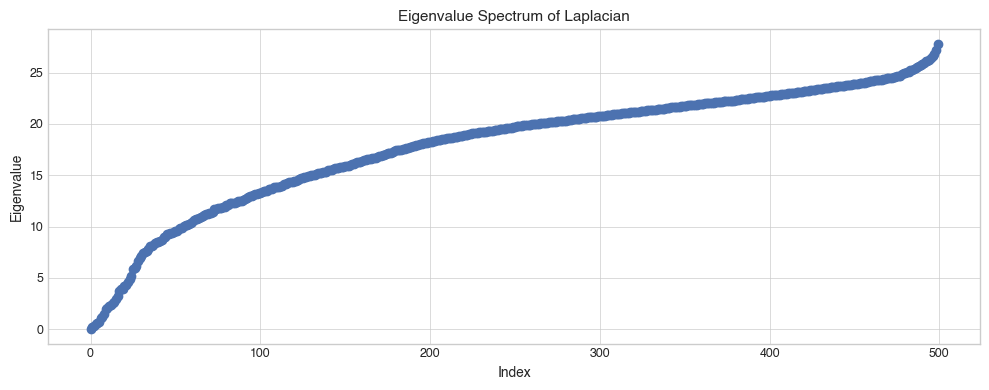

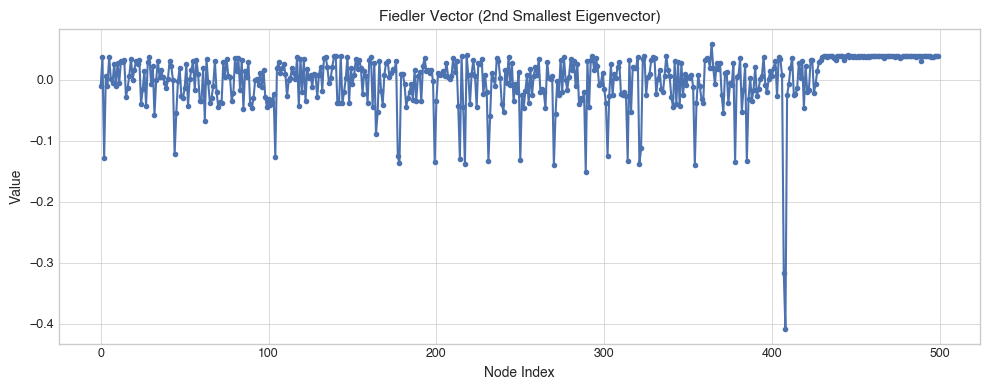

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.5180
Adjusted Rand Index    : -0.0315
Normalized Mutual Info : 0.1372
F1 Score               : 0.3675

Confusion Matrix:
[[189 241]
 [  0  70]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.5160
Adjusted Rand Index    : -0.0328
Normalized Mutual Info : 0.1364
F1 Score               : 0.3665

Confusion Matrix:
[[188 242]
 [  0  70]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.6420
Adjusted Rand Index    : 0.0798
Normalized Mutual Info : 0.1988
F1 Score               : 0.4389

Confusion Matrix:
[[251 179]
 [  0  70]]
Number of connected components (zero eigenvalues): 1
Smallest eigenvalues: [7.10542736e-15 2.09195095e-01 3.20629107e-01 5.01128680e-01
 6.16889919e-01]


In [31]:
eigenvals, eigenvecs = analyze_laplacian(adjacency_matrix.numpy(), np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

#### Loss based approach

In [19]:
def get_spectral_heat_times(eigenvalues, num_times=5):
    # Filter out the zero eigenvalue (connected component)
    valid_eigs = eigenvalues[eigenvalues > 1e-5]

    lambda_max = valid_eigs.max()
    lambda_min = valid_eigs.min() # This is roughly lambda_2

    # Invert to get time scales
    t_min = 1.0 / lambda_max
    t_max = 1.0 / lambda_min

    # Create log-spaced times
    # We often multiply t_max by a factor (e.g., 2 or 4) to ensure full global coverage
    return torch.logspace(torch.log10(t_min), torch.log10(t_max * 4), num_times)

def compute_heat_kernel_divergence(adj: torch.Tensor, distances: torch.Tensor, heat_times: torch.Tensor, latent_dim: int) -> torch.Tensor:
    dist_sq = distances.pow(2).unsqueeze(-1)
    coeffs = (4 * torch.pi * heat_times).pow(-latent_dim / 2)
    exp_term = torch.exp(-dist_sq / (4 * heat_times))
    kernel_stack = coeffs * exp_term
    divergence = (adj-kernel_stack.sum(dim=-1)).pow(2)
    return divergence
        

from framework.geometry import compute_graph_laplacian
adjacency_matrix = torch.tensor(adjacency_matrix)
laplacian = compute_graph_laplacian(adjacency_matrix=adjacency_matrix)
heat_times = get_spectral_heat_times(eigenvalues=torch.clamp(laplacian,min=0.0), num_times=num_heat_times)

div_phase1 = compute_heat_kernel_divergence(adjacency_matrix, torch.tensor(dists_phase1), heat_times, 2)
div_phase2 = compute_heat_kernel_divergence(adjacency_matrix, torch.tensor(dists_phase2), heat_times, 2)

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/827550018.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  div_phase1 = compute_heat_kernel_divergence(adjacency_matrix, torch.tensor(dists_phase1), heat_times, 2)
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/827550018.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  div_phase2 = compute_heat_kernel_divergence(adjacency_matrix, torch.tensor(dists_phase2), heat_times, 2)


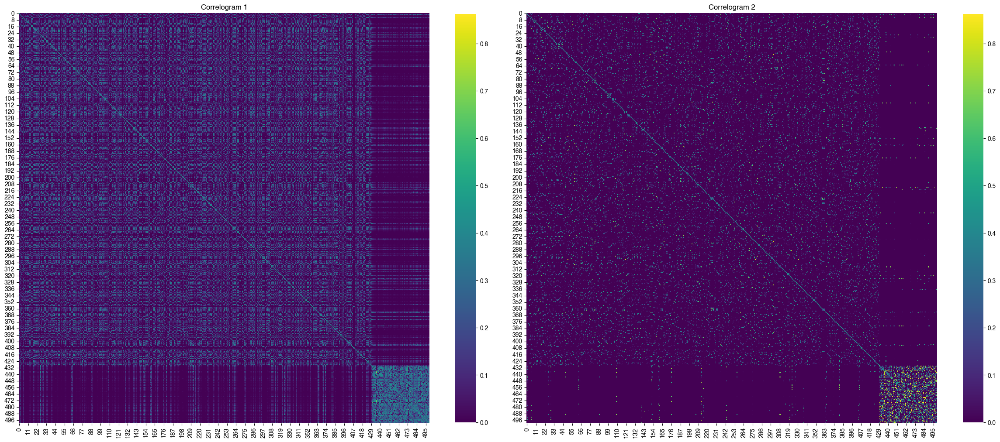

<module 'matplotlib.pyplot' from '/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/matplotlib/pyplot.py'>

In [20]:
plot_correlogram(div_phase1, div_phase2)

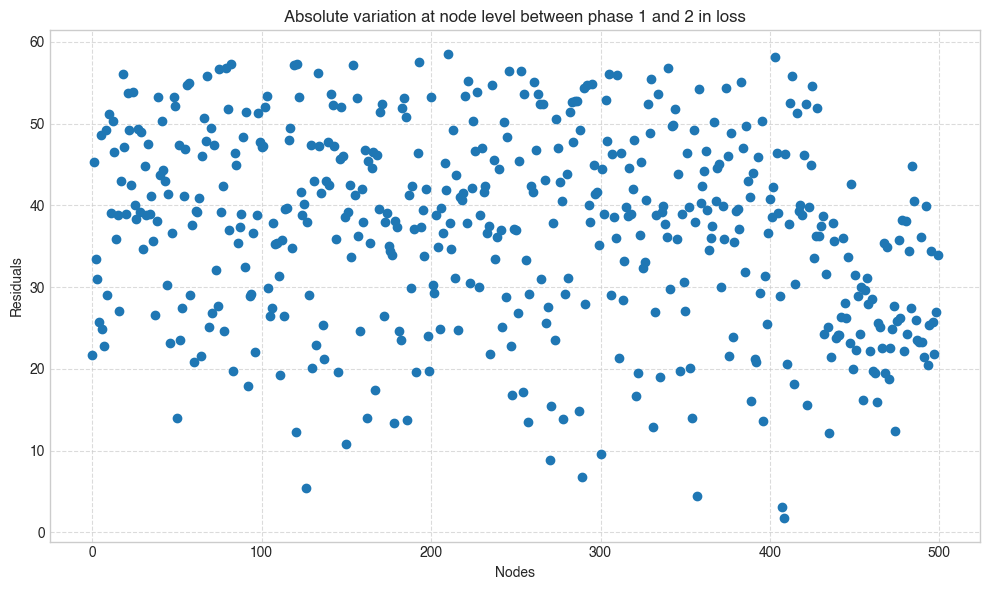

In [21]:
plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
#plt.plot(np.sum(res, axis=0)/np.max(np.sum(res, axis=0), axis=0), marker='o', linestyle='')
#plt.plot(np.sum(res2, axis=0)/np.max(np.sum(res2, axis=0), axis=0), marker='o', linestyle='')
res_loss = np.abs((div_phase2 - div_phase1))

plt.plot(np.sum(np.nan_to_num(res_loss, 0.0), axis=0), marker='o', linestyle='')
# Add a horizontal line at y=0

# --- Customize the Plot ---
#plt.savefig("dists_total_var_phase1_2.png", dpi=500, bbox_inches='tight')

plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Absolute variation at node level between phase 1 and 2 in loss') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

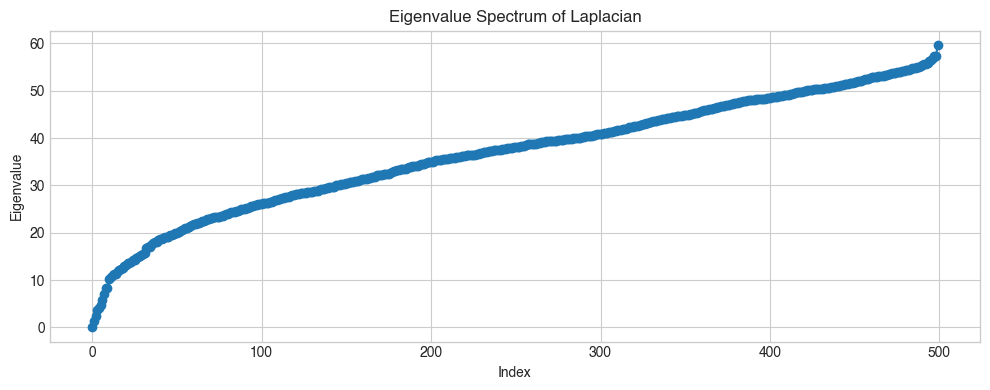

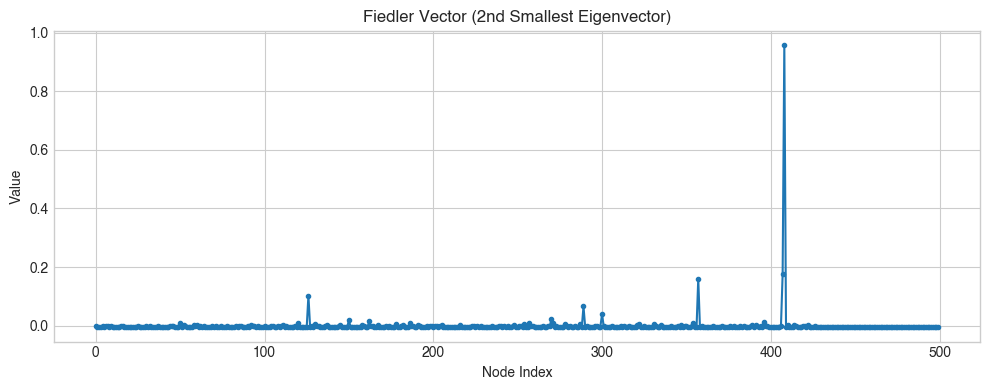

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.7480
Adjusted Rand Index    : -0.0968
Normalized Mutual Info : 0.0477
F1 Score               : 0.0000

Confusion Matrix:
[[374  56]
 [ 70   0]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.5760
Adjusted Rand Index    : 0.0138
Normalized Mutual Info : 0.1632
F1 Score               : 0.3977

Confusion Matrix:
[[218 212]
 [  0  70]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.6820
Adjusted Rand Index    : 0.1285
Normalized Mutual Info : 0.2248
F1 Score               : 0.4682

Confusion Matrix:
[[271 159]
 [  0  70]]
Number of connected components (zero eigenvalues): 1
Smallest eigenvalues: [-1.42108547e-14  1.31352050e+00  2.37502980e+00  3.73537064e+00
  4.16154987e+00]


In [23]:
eigenvals, eigenvecs = analyze_laplacian(div_phase1.numpy(), np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

#### Residuals based approach

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_78681/2485397397.py:8: RuntimeWarning: invalid value encountered in divide
  res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)


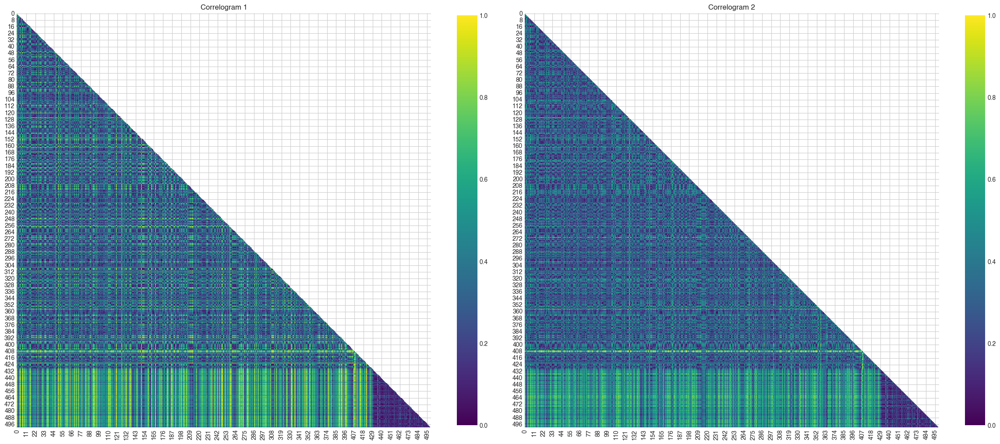

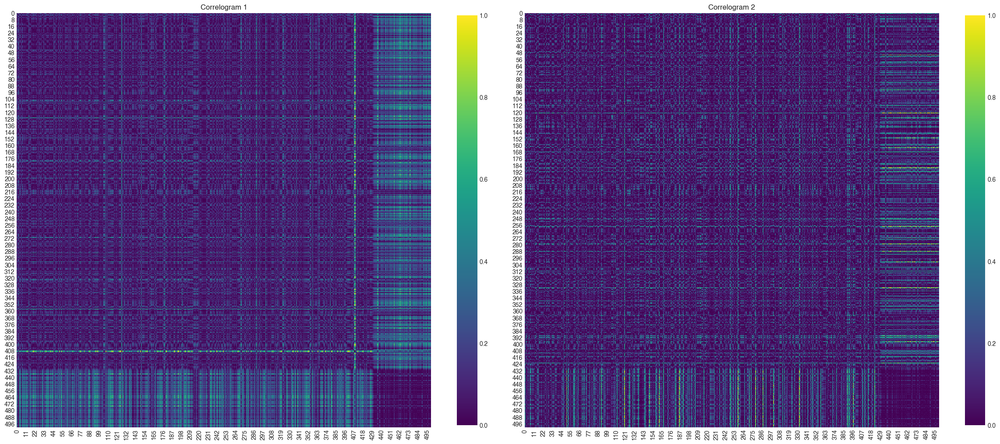

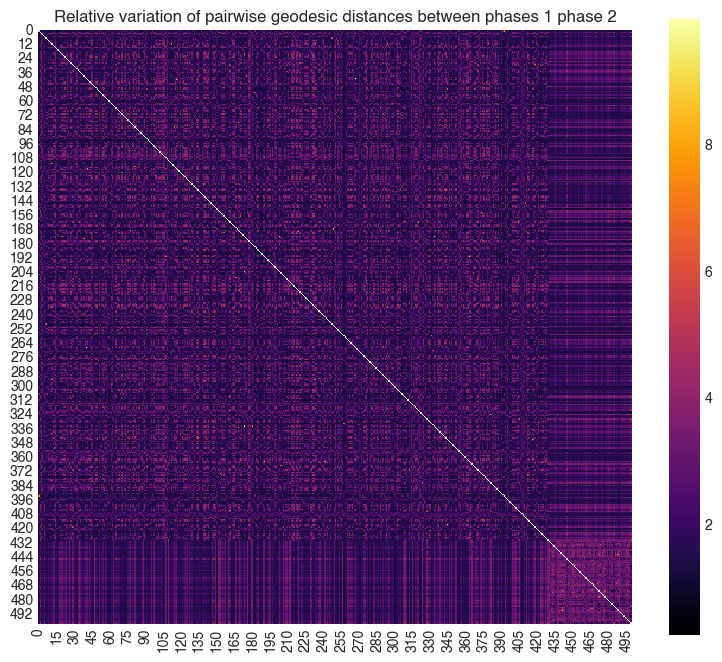

In [24]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

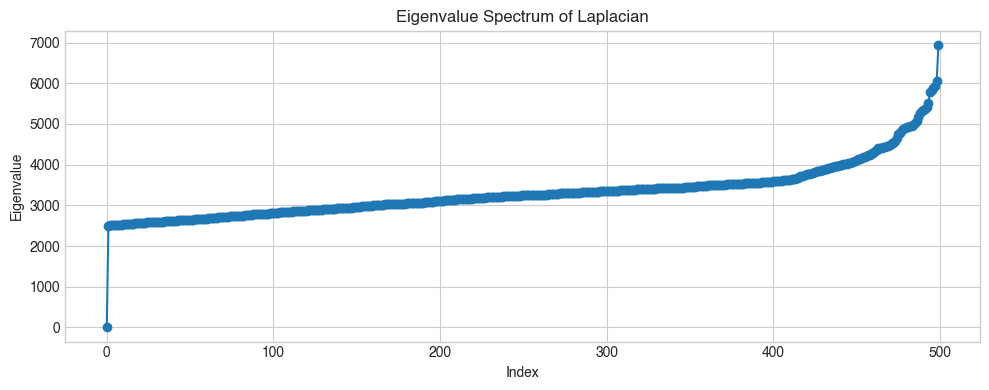

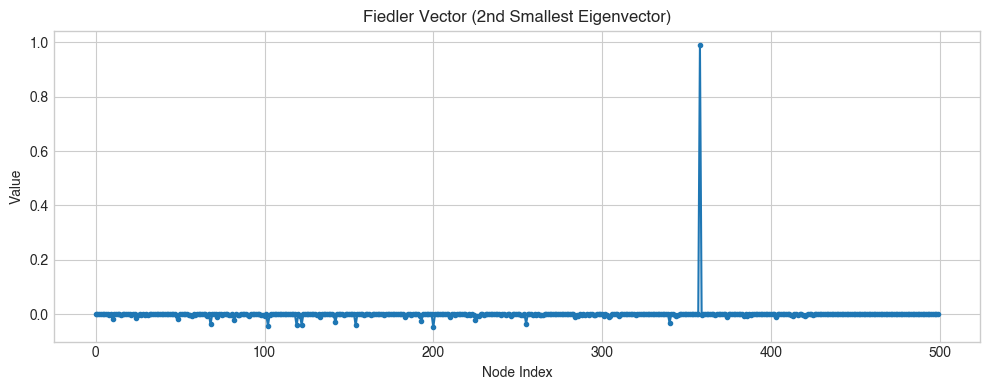

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.8640
Adjusted Rand Index    : 0.0859
Normalized Mutual Info : 0.0421
F1 Score               : 0.1282

Confusion Matrix:
[[427   3]
 [ 65   5]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.5700
Adjusted Rand Index    : -0.0537
Normalized Mutual Info : 0.0412
F1 Score               : 0.0611

Confusion Matrix:
[[278 152]
 [ 63   7]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering
--------------------------------
Accuracy               : 0.5480
Adjusted Rand Index    : -0.0079
Normalized Mutual Info : 0.0019
F1 Score               : 0.1812

Confusion Matrix:
[[249 181]
 [ 45  25]]
Number of connected components (zero eigenvalues): 0
Smallest eigenvalues: [1.4648438e-03 2.4865864e+03 2.5130789e+03 2.5153318e+03 2.5164329e+03]


In [25]:
eigenvals, eigenvecs = analyze_laplacian(res, np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

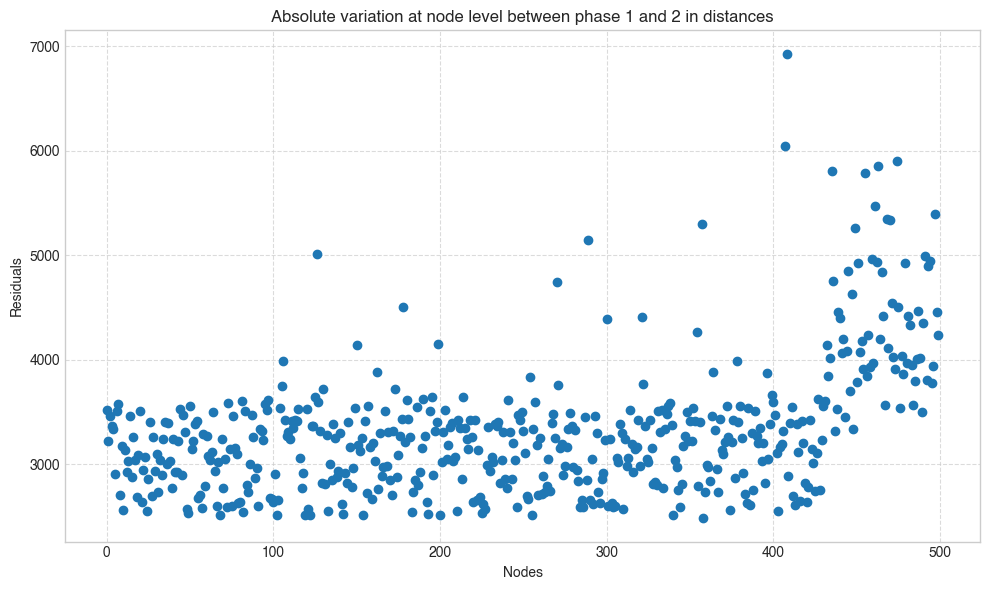

In [26]:
plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
#plt.plot(np.sum(res, axis=0)/np.max(np.sum(res, axis=0), axis=0), marker='o', linestyle='')
#plt.plot(np.sum(res2, axis=0)/np.max(np.sum(res2, axis=0), axis=0), marker='o', linestyle='')
plt.plot(np.sum(np.nan_to_num(res, 0.0), axis=0), marker='o', linestyle='')
# Add a horizontal line at y=0

# --- Customize the Plot ---
#plt.savefig("dists_total_var_phase1_2.png", dpi=500, bbox_inches='tight')

plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Absolute variation at node level between phase 1 and 2 in distances') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

In [27]:
from scipy import stats

sums = np.sum(np.nan_to_num(res, 0.0), axis=0)
group_clean, group_corrupted = sums[:-CORRUPTED_NODES], sums[-CORRUPTED_NODES:]
# 3. Perform the t-test
# We use equal_var=False to perform Welch's t-test, which does not assume 
# equal population variance (often safer when comparing normal vs corrupted data).
t_stat, p_val = stats.ttest_ind(group_clean, group_corrupted, equal_var=False)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_val}")

def cohens_d(group1, group2):
    # Calculate the size of samples
    n1, n2 = len(group1), len(group2)
    
    # Calculate the variance of the samples
    var1, var2 = np.var(group1, ddof=1), np.var(group2, ddof=1)
    
    # Calculate the pooled standard deviation
    # (n1-1)*var1 + (n2-1)*var2  /  (n1+n2-2)
    pooled_se = np.sqrt(((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2))
    
    # Calculate means
    mu1, mu2 = np.mean(group1), np.mean(group2)
    
    # Calculate Cohen's d
    return (mu1 - mu2) / pooled_se

# Calculate and print
d = cohens_d(group_clean, group_corrupted)
print(f"Cohen's d: {d}")

T-statistic: -14.447474375103923
P-value: 3.884007670263606e-24
Cohen's d: -2.348771820079751


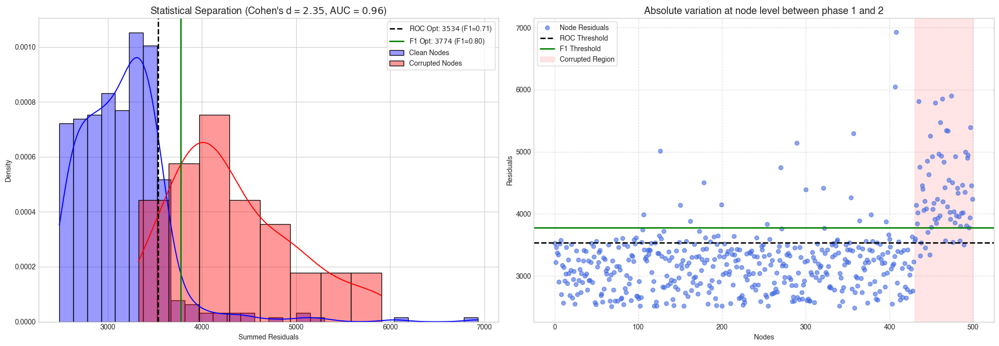

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, f1_score

# Reconstruct the full array for the scatter plot
all_scores_ordered = np.concatenate([group_clean, group_corrupted])
true_labels = np.concatenate([np.zeros(len(group_clean)), np.ones(len(group_corrupted))])

# --- 2. Calculate Thresholds ---
# ROC Optimal (Youden's J)
fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
ix_roc = np.argmax(tpr - fpr)
best_thresh_roc = roc_thresholds[ix_roc]
roc_auc = auc(fpr, tpr)
f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

# F1 Optimal (Max F1)
precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
ix_f1 = np.argmax(f1_scores)
best_thresh_f1 = pr_thresholds[ix_f1]
best_f1_val = f1_scores[ix_f1]

# --- 3. Plotting ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

# === LEFT PANEL: Statistical Separation (Histograms) ===
sns.histplot(group_clean, color="blue", label="Clean Nodes", kde=True, stat="density", alpha=0.4, ax=ax1)
sns.histplot(group_corrupted, color="red", label="Corrupted Nodes", kde=True, stat="density", alpha=0.4, ax=ax1)

# Threshold Lines
ax1.axvline(best_thresh_roc, color='k', linestyle='--', linewidth=2, 
            label=fr'ROC Opt: ${best_thresh_roc:.0f}$ (F1={f1_at_roc:.2f})')
ax1.axvline(best_thresh_f1, color='green', linestyle='-', linewidth=2, 
            label=fr'F1 Opt: ${best_thresh_f1:.0f}$ (F1={best_f1_val:.2f})')

ax1.set_title(fr"Statistical Separation (Cohen's d = $2.35$, AUC = ${roc_auc:.2f}$)", fontsize=14)
ax1.set_xlabel('Summed Residuals')
ax1.legend(loc='upper right', frameon=True)


# === RIGHT PANEL: Node-wise View (Scatter) ===
# We plot the full ordered array. The last N points are the corrupted ones.
ax2.plot(all_scores_ordered, marker='o', linestyle='', alpha=0.6, color='royalblue', label='Node Residuals')

# Add Horizontal Threshold Lines (Matching the Left Panel)
ax2.axhline(best_thresh_roc, color='k', linestyle='--', linewidth=2, label='ROC Threshold')
ax2.axhline(best_thresh_f1, color='green', linestyle='-', linewidth=2, label='F1 Threshold')

# visual aid: Highlight the corrupted region
ax2.axvspan(len(group_clean), len(all_scores_ordered), color='red', alpha=0.1, label='Corrupted Region')

ax2.set_xlabel('Nodes')
ax2.set_ylabel('Residuals')
ax2.set_title('Absolute variation at node level between phase 1 and 2', fontsize=14)
ax2.legend(loc='upper left', frameon=True)
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


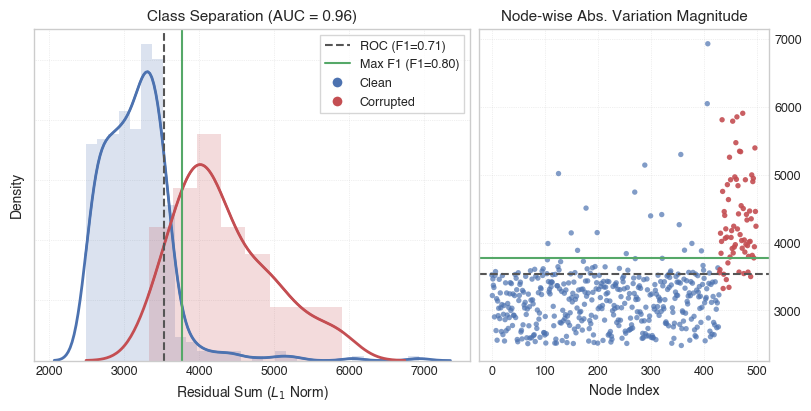

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, f1_score
from matplotlib.lines import Line2D

# --- 1. ICML Style Configuration (Boxed Edition) ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans'],
    'pdf.fonttype': 42,
    'ps.fonttype': 42,

    'font.size': 10,
    'axes.labelsize': 10,
    'axes.titlesize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 12,

    # --- BOXED STYLE SETTINGS ---
    'axes.linewidth': 1.0,       
    'grid.linewidth': 0.5,
    'lines.linewidth': 1.5,
    
    # 1. Point ticks inward
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    
    # 2. Enable ticks on Top and Right (Mirroring)
    'xtick.top': True,
    'ytick.right': True,
    
    # 3. Force all Spines (Borders) to be visible
    'axes.spines.top': True,
    'axes.spines.right': True,
    'axes.spines.left': True,
    'axes.spines.bottom': True,

    'axes.prop_cycle': plt.cycler('color', sns.color_palette("deep")) 
})

# --- 2. Data Logic (Your original logic) ---
all_scores_ordered = np.concatenate([group_clean, group_corrupted])
true_labels = np.concatenate([np.zeros(len(group_clean)), np.ones(len(group_corrupted))])

# --- 3. Calculate Stats ---
fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
ix_roc = np.argmax(tpr - fpr)
best_thresh_roc = roc_thresholds[ix_roc]
roc_auc = auc(fpr, tpr)
f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
ix_f1 = np.argmax(f1_scores)
best_thresh_f1 = pr_thresholds[ix_f1]
best_f1_val = f1_scores[ix_f1]

# --- 4. Plotting ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True, gridspec_kw={'width_ratios': [3, 2]})

c_clean = "#4C72B0"
c_corr = "#C44E52"
c_roc = "#555555"
c_f1 = "#55A868"

# === LEFT PANEL: Histograms ===
sns.histplot(group_clean, color=c_clean, label="Clean", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)
sns.histplot(group_corrupted, color=c_corr, label="Corrupted", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)

sns.kdeplot(group_clean, color=c_clean, ax=ax1, linewidth=2)
sns.kdeplot(group_corrupted, color=c_corr, ax=ax1, linewidth=2)

ax1.axvline(best_thresh_roc, color=c_roc, linestyle='--', label=f'ROC Opt')
ax1.axvline(best_thresh_f1, color=c_f1, linestyle='-', label=f'F1 Opt')

ax1.set_title(f"Class Separation (AUC = {roc_auc:.2f})")
ax1.set_xlabel('Residual Sum ($L_1$ Norm)')
ax1.set_ylabel('Density')
ax1.set_yticklabels([])

# Legend: Added specific formatting for a box around the legend too
#ax1.legend(frameon=True, fancybox=False, loc='upper right')
# Custom Legend with Box
legend_elements = [
    Line2D([0], [0], color=c_roc, linestyle='--', label=f'ROC (F1={f1_at_roc:.2f})'),
    Line2D([0], [0], color=c_f1, linestyle='-', label=f'Max F1 (F1={best_f1_val:.2f})'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_clean, label='Clean', markersize=8),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_corr, label='Corrupted', markersize=8)
]
ax1.legend(handles=legend_elements, frameon=True, fancybox=False, loc='upper right')
ax1.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax1)` to keep the box intact.

# === RIGHT PANEL: Scatter ===
clean_indices = np.arange(len(group_clean))
corr_indices = np.arange(len(group_clean), len(all_scores_ordered))

ax2.scatter(clean_indices, group_clean, s=15, alpha=0.7, color=c_clean, label='Clean Nodes', edgecolors='none')
ax2.scatter(corr_indices, group_corrupted, s=15, alpha=0.9, color=c_corr, label='Corrupted Nodes', edgecolors='none')

ax2.axhline(best_thresh_roc, color=c_roc, linestyle='--', linewidth=1.5, label='ROC Thresh')
ax2.axhline(best_thresh_f1, color=c_f1, linestyle='-', linewidth=1.5, label='F1 Thresh')

ax2.set_xlabel('Node Index')
#ax2.set_ylabel('Residual Magnitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

ax2.set_title('Node-wise Abs. Variation Magnitude')

ax2.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax2)` here as well.
plt.savefig("swiss_res.pdf", dpi=300, bbox_inches='tight')
plt.show()